In [1]:
%config InlineBackend.figure_format = "svg"

from scipy.interpolate import griddata
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

## Import the data

In [2]:
xyz_df = pd.read_table("data/depth-mono.xyz", delim_whitespace=True, names=["x", "y", "z"])
xyz_df

,x,y,z
0,0.14765,0.08176,0.42588
1,0.14765,0.08176,0.42590
2,0.14765,0.08176,0.42590
3,0.14765,0.08176,0.42590
4,0.14529,0.08143,0.42471
...,...,...,...
195176,-0.10176,0.02882,0.26931
195177,-0.10176,0.02942,0.26941
195178,-0.10059,0.02882,0.26938
195179,-0.10059,0.02905,0.26941


In [3]:
xyz_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195181 entries, 0 to 195180
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   x       195181 non-null  float64
 1   y       195181 non-null  float64
 2   z       195181 non-null  float64
dtypes: float64(3)
memory usage: 4.5 MB


No missing values and all variables are continuous numeric (cartesian coordinates).

In [4]:
xyz_df.describe()

,x,y,z
count,195181.000000,195181.000000,195181.000000
mean,0.014848,-0.028294,0.318972
std,0.086907,0.069455,0.039743
min,-0.149410,-0.150000,0.268700
25%,-0.059410,-0.090000,0.284430
50%,0.022940,-0.025820,0.307920
75%,0.092350,0.032350,0.350420
max,0.150000,0.087650,0.425900


Let's check for outliers in this data using boxplots:

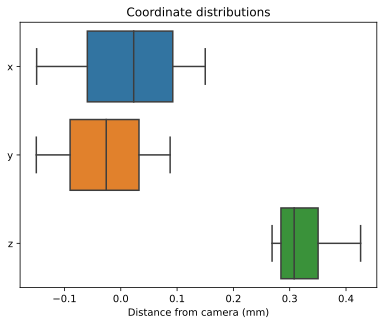

In [5]:
# Make box plots for coordinate distributions
plt.title("Coordinate distributions")
sns.boxplot(data=xyz_df, orient="h")
plt.xlabel("Distance from camera (mm)")
plt.show()

Seem like there are no outliers, data seems to be fairly clean (although probably noisy)

In [6]:
depth_df = pd.read_table("data/depth.txt", names=["depth"])
depth_df

,depth
0,8.220060
1,8.234476
2,8.234476
3,8.234476
4,9.254441
...,...
195176,0.248882
195177,0.653718
195178,0.624659
195179,0.856181


# TASK 1: Data visualization

For the data visualization we will start with a surface plot. 

In [7]:
# Convert data to numpy
x, y, z = xyz_df.x, xyz_df.y, xyz_df.z
depth = depth_df.values

# Convert data into grid
x_linspace = np.linspace(xyz_df.x.min(), xyz_df.x.max(), 100)
y_linspace = np.linspace(xyz_df.y.min(), xyz_df.y.max(), 100)
X, Y = np.meshgrid(x_linspace, y_linspace)

# Create interpolated griddata
Z = griddata((x, y), z, (X, Y), method="cubic")
Depth = griddata((x, y), depth, (X, Y), method="cubic")

fig = go.Figure(go.Surface(x=x_linspace, y=y_linspace, z=Z, surfacecolor=Depth))
fig.show()